# Prediction of Zinc binding domains

https://github.com/samirelanduk/ZincBindPredict

https://academic.oup.com/database/article/doi/10.1093/database/baz006/5304468

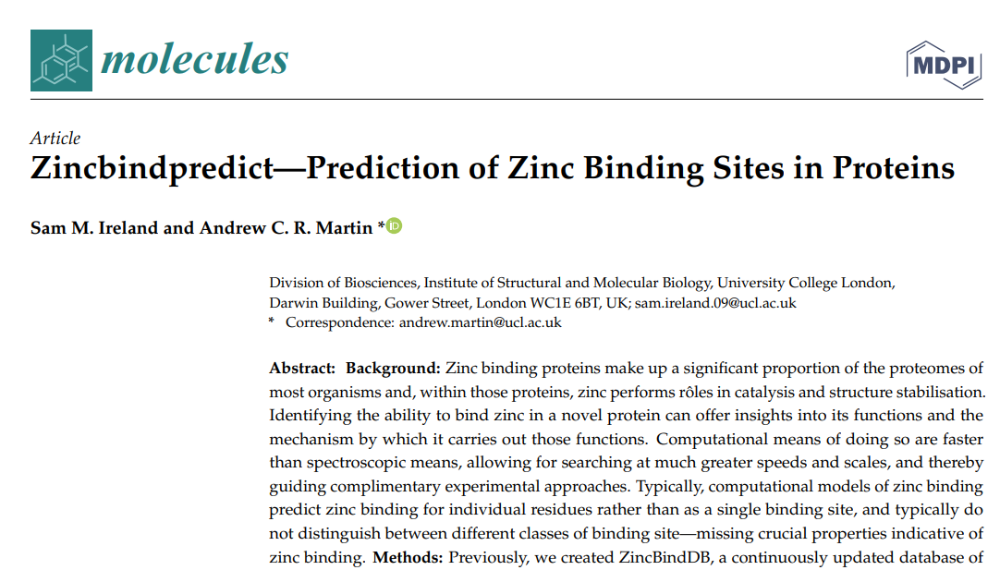

In [1]:
import tensorflow as tf
import pandas as pd

import datetime
import os

import numpy as np

import glob

# Load the TensorBoard notebook extension
%load_ext tensorboard

In [2]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
import plotly.express as px

## Divide randomly into train-validate-test splits

We need to make sure we have all classes included in each split so we do the split each time we load the class CSV.

In [3]:
train_test_split = 0.6
test_validate_split = 0.5

In [4]:
def train_val_test_split(df, train_test_split, test_validate_split):

    train = df.sample(
        frac=train_test_split, random_state=816
    )  # random state is a seed value

    validate_temp = df.drop(train.index)
    validate = validate_temp.sample(frac=test_validate_split, random_state=816)
    test = validate_temp.drop(validate.index)

    return train, validate, test

In [78]:
files = glob.glob("../data/csv/structure/*.csv")

df_train = pd.DataFrame()
df_test = pd.DataFrame()
df_validate = pd.DataFrame()

type_names = []

for idx, file in enumerate(files):

    print(f"Appending {file}")
    df = pd.read_csv(file)
    df["Type"] = idx
    type_names += [os.path.basename(file).split(".")[0]]

    train, validate, test = train_val_test_split(df, train_test_split, test_validate_split)
    
    df_train = df_train.append(train)  # random state is a seed value
    df_validate = df_validate.append(validate)
    df_test = df_test.append(test)

Appending ../data/csv/structure/C4.csv
Appending ../data/csv/structure/H3.csv
Appending ../data/csv/structure/C2H2.csv
Appending ../data/csv/structure/C3H1.csv
Appending ../data/csv/structure/E1H1.csv
Appending ../data/csv/structure/C2H1.csv
Appending ../data/csv/structure/D1H1.csv
Appending ../data/csv/structure/E1H2.csv
Appending ../data/csv/structure/D1H2.csv
Appending ../data/csv/structure/C3.csv


In [79]:
df_all = df_train.append(df_validate).append(df_test)

In [80]:
df_all.shape

(65008, 85)

## Remove any duplicate rows

Otherwise we might leak training data into test data

In [81]:
df_all.columns

Index(['Unnamed: 0', 'ca_mean', 'ca_std', 'ca_min', 'ca_max', 'cb_mean',
       'cb_std', 'cb_min', 'cb_max', 'hcf', 'gap1', 'hydrophobicity1',
       'hydrophobicity_window_1', 'hydrophobicity_window_3',
       'hydrophobicity_window_5', 'charged_window_1', 'charged_window_3',
       'charged_window_5', 'A_window_1', 'A_window_3', 'A_window_5',
       'R_window_1', 'R_window_3', 'R_window_5', 'N_window_1', 'N_window_3',
       'N_window_5', 'D_window_1', 'D_window_3', 'D_window_5', 'C_window_1',
       'C_window_3', 'C_window_5', 'E_window_1', 'E_window_3', 'E_window_5',
       'Q_window_1', 'Q_window_3', 'Q_window_5', 'G_window_1', 'G_window_3',
       'G_window_5', 'H_window_1', 'H_window_3', 'H_window_5', 'I_window_1',
       'I_window_3', 'I_window_5', 'L_window_1', 'L_window_3', 'L_window_5',
       'K_window_1', 'K_window_3', 'K_window_5', 'M_window_1', 'M_window_3',
       'M_window_5', 'F_window_1', 'F_window_3', 'F_window_5', 'P_window_1',
       'P_window_3', 'P_window_5', '

In [82]:
df_all = df_all.drop_duplicates()

In [83]:
n_train = int(df_all.shape[0] * train_test_split)

In [84]:
df_train_original = df_all.iloc[:n_train, :]
df_remain = df_all.drop(df_train.index)

In [85]:
n_test = int(df_remain.shape[0] * test_validate_split)

In [86]:
df_test_original = df_remain.iloc[n_test:, :]

In [87]:
df_validate_original = df_remain.drop(df_test_original.index)

In [88]:
type_names

['C4', 'H3', 'C2H2', 'C3H1', 'E1H1', 'C2H1', 'D1H1', 'E1H2', 'D1H2', 'C3']

In [89]:
np.sort(df_train["Type"].unique())

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [90]:
np.sort(df_test["Type"].unique())

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [91]:
np.sort(df_validate["Type"].unique())

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [92]:
df.columns

Index(['Unnamed: 0', 'ca_mean', 'ca_std', 'ca_min', 'ca_max', 'cb_mean',
       'cb_std', 'cb_min', 'cb_max', 'hcf', 'gap1', 'hydrophobicity1',
       'hydrophobicity_window_1', 'hydrophobicity_window_3',
       'hydrophobicity_window_5', 'charged_window_1', 'charged_window_3',
       'charged_window_5', 'A_window_1', 'A_window_3', 'A_window_5',
       'R_window_1', 'R_window_3', 'R_window_5', 'N_window_1', 'N_window_3',
       'N_window_5', 'D_window_1', 'D_window_3', 'D_window_5', 'C_window_1',
       'C_window_3', 'C_window_5', 'E_window_1', 'E_window_3', 'E_window_5',
       'Q_window_1', 'Q_window_3', 'Q_window_5', 'G_window_1', 'G_window_3',
       'G_window_5', 'H_window_1', 'H_window_3', 'H_window_5', 'I_window_1',
       'I_window_3', 'I_window_5', 'L_window_1', 'L_window_3', 'L_window_5',
       'K_window_1', 'K_window_3', 'K_window_5', 'M_window_1', 'M_window_3',
       'M_window_5', 'F_window_1', 'F_window_3', 'F_window_5', 'P_window_1',
       'P_window_3', 'P_window_5', '

In [93]:
model = DecisionTreeClassifier()
# fit the model
fields = ["ca_mean", "ca_std", "ca_min", "ca_max", 
          "cb_mean", "cb_std", "cb_min", "cb_max",
         "hcf", "gap1", "gap2", "gap3",
          'hydrophobicity1',
       'hydrophobicity_window_1', 'hydrophobicity_window_3',
       'hydrophobicity_window_5', 'charged_window_1', 'charged_window_3',
       'charged_window_5']
#         , 'A_window_1', 'A_window_3', 'A_window_5',
#        'R_window_1', 'R_window_3', 'R_window_5', 'N_window_1', 'N_window_3',
#        'N_window_5', 'D_window_1', 'D_window_3', 'D_window_5', 'C_window_1',
#        'C_window_3', 'C_window_5', 'E_window_1', 'E_window_3', 'E_window_5',
#        'Q_window_1', 'Q_window_3', 'Q_window_5', 'G_window_1', 'G_window_3',
#        'G_window_5', 'H_window_1', 'H_window_3', 'H_window_5', 'I_window_1',
#        'I_window_3', 'I_window_5', 'L_window_1', 'L_window_3', 'L_window_5',
#        'K_window_1', 'K_window_3', 'K_window_5', 'M_window_1', 'M_window_3',
#        'M_window_5', 'F_window_1', 'F_window_3', 'F_window_5', 'P_window_1',
#        'P_window_3', 'P_window_5', 'S_window_1', 'S_window_3', 'S_window_5',
#        'T_window_1', 'T_window_3', 'T_window_5', 'W_window_1', 'W_window_3',
#        'W_window_5', 'Y_window_1', 'Y_window_3', 'Y_window_5', 'V_window_1',
#        'V_window_3', 'V_window_5', 'hydrophobicity2', 'hydrophobicity3' ]
model.fit(df_train[fields], df_train["positive"])
# get importance
importance = model.feature_importances_
# summarize feature importance
# for i, v in enumerate(importance):
#     print("Feature: %0d, %s Score: %.5f" % (i, df_train[fields].columns[i], v))


print(df.columns[np.argsort(-importance)])

# plot feature importance
px.bar([x for x in range(len(importance))], importance, y=df_train[fields].columns)

Index(['cb_min', 'Unnamed: 0', 'hydrophobicity_window_3', 'A_window_1',
       'charged_window_1', 'cb_max', 'cb_std', 'ca_std',
       'hydrophobicity_window_1', 'ca_max', 'cb_mean', 'charged_window_5',
       'gap1', 'hydrophobicity1', 'ca_mean', 'hydrophobicity_window_5',
       'charged_window_3', 'ca_min', 'hcf'],
      dtype='object')


In [75]:
df_all.describe()

,Unnamed: 0,ca_mean,ca_std,ca_min,ca_max,cb_mean,cb_std,cb_min,cb_max,hcf,...,Y_window_5,V_window_1,V_window_3,V_window_5,positive,gap2,gap3,hydrophobicity2,hydrophobicity3,Type
count,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,...,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000,65008.000000
mean,1688.086466,11.712442,3.341933,6.777715,16.146515,10.901569,3.227087,5.945110,15.148591,103.258788,...,0.025068,0.035323,0.043362,0.043827,0.500000,22.075483,5.525458,0.307517,0.342226,4.809746
std,1003.849699,5.450045,2.477099,2.851410,8.274532,6.055063,2.672959,3.234275,9.044093,189.736657,...,0.029841,0.065726,0.043725,0.039082,0.500004,18.238771,9.780203,0.231324,0.377165,2.729866
min,0.000000,4.759000,0.557000,3.537000,5.529000,4.184000,0.261000,2.812000,5.324000,-802.467000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.130000,-1.205000,0.000000
25%,818.750000,6.798000,1.233000,5.286000,8.513000,5.322000,0.862000,3.935000,6.580000,-4.217000,...,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,2.000000,0.176000,0.227000,2.000000
50%,1650.000000,8.311000,1.793000,5.596000,10.516000,7.059000,1.550000,4.201000,8.661000,133.226500,...,0.025000,0.000000,0.042000,0.050000,0.500000,16.000000,2.000000,0.296000,0.387000,5.000000
75%,2553.000000,16.931000,5.419000,6.780000,24.742000,16.699000,5.472000,6.878000,24.416000,245.394000,...,0.025000,0.125000,0.083000,0.050000,1.000000,32.000000,6.000000,0.448000,0.420000,7.000000
max,3503.000000,26.017000,11.327000,22.907000,29.991000,26.763000,11.603000,22.576000,32.300000,687.105000,...,0.175000,0.375000,0.250000,0.225000,1.000000,279.000000,205.000000,2.020000,2.020000,9.000000


## Use just some of the features (columns)

Define which columns to use by changing take_idx

In [101]:
take_idx = ["cb_max", "ca_mean"] #, "N_window_3"] # ["cb_max"]
df_train = df_train_original[take_idx + ["positive", "Type"]]
df_test = df_test_original[take_idx + ["positive", "Type"]]
df_validate = df_validate_original[take_idx + ["positive", "Type"]]

In [102]:
y_train = df_train_original["positive"]
x_train = df_train_original[take_idx]

y_validate = df_validate_original["positive"]
x_validate = df_validate_original[take_idx]

y_test = df_test_original["positive"]
x_test = df_test_original[take_idx]

In [103]:
df_train_original.iloc[:,1:].corr()

,ca_mean,ca_std,ca_min,ca_max,cb_mean,cb_std,cb_min,cb_max,hcf,gap1,...,Y_window_5,V_window_1,V_window_3,V_window_5,positive,gap2,gap3,hydrophobicity2,hydrophobicity3,Type
ca_mean,1.000000,0.865958,0.667273,0.974097,0.994160,0.863824,0.705052,0.970107,-0.511706,-0.130606,...,-0.207889,-0.303595,-0.198846,-0.201859,-0.863400,-0.028031,-0.024991,0.059666,0.098211,0.006027
ca_std,0.865958,1.000000,0.280409,0.931872,0.870672,0.989579,0.348907,0.926889,-0.508574,-0.129344,...,-0.206372,-0.307242,-0.212191,-0.214749,-0.853886,0.002282,-0.033917,0.029763,0.107201,0.004539
ca_min,0.667273,0.280409,1.000000,0.583122,0.653209,0.289775,0.943908,0.577253,-0.265643,-0.075292,...,-0.112736,-0.156044,-0.087943,-0.091329,-0.467918,-0.028522,-0.006650,0.051732,0.043008,0.003141
ca_max,0.974097,0.931872,0.583122,1.000000,0.973477,0.927565,0.628395,0.993442,-0.529521,-0.134054,...,-0.213067,-0.315368,-0.209278,-0.212642,-0.893900,-0.015998,-0.024853,0.051494,0.102465,0.006573
cb_mean,0.994160,0.870672,0.653209,0.973477,1.000000,0.873060,0.708107,0.979096,-0.520900,-0.134088,...,-0.218953,-0.308389,-0.199987,-0.202812,-0.884496,-0.036599,-0.015682,0.062448,0.099790,0.006668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gap2,-0.028031,0.002282,-0.028522,-0.015998,-0.036599,0.002723,-0.077401,-0.025405,0.061866,0.008659,...,-0.060061,-0.250510,-0.263566,-0.222406,0.019732,1.000000,-0.273234,-0.302891,-0.033696,-0.023410
gap3,-0.024991,-0.033917,-0.006650,-0.024853,-0.015682,-0.034133,0.012148,-0.022222,0.101227,-0.016601,...,0.020038,0.161574,0.203497,0.211771,0.037885,-0.273234,1.000000,0.032388,-0.062529,0.030786
hydrophobicity2,0.059666,0.029763,0.051732,0.051494,0.062448,0.036076,0.075555,0.057983,-0.073843,0.193496,...,-0.087318,-0.103888,0.028871,0.085329,-0.046626,-0.302891,0.032388,1.000000,-0.134380,0.018533
hydrophobicity3,0.098211,0.107201,0.043008,0.102465,0.099790,0.099826,0.059407,0.101910,-0.085278,-0.006999,...,-0.067599,0.052626,0.010547,0.073119,-0.119472,-0.033696,-0.062529,-0.134380,1.000000,-0.011224


<AxesSubplot:>

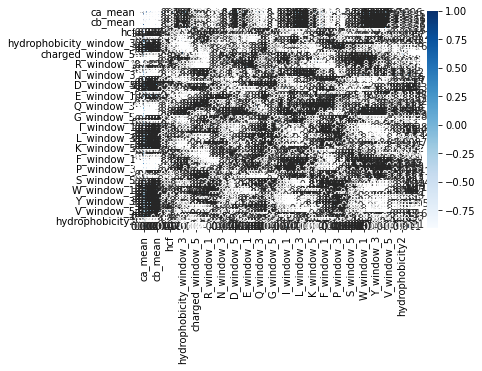

In [104]:
import seaborn as sb

%matplotlib inline 
corr = df_train_original.iloc[:,1:].corr()
sb.heatmap(corr, cmap="Blues", annot=True)

## Create a TensorFlow model

This is a very simple MLP with 2 layers and dropout.

In [105]:
inputs_to_model = tf.keras.layers.Input([x_train.shape[1]], name="myinput")

layer1 = tf.keras.layers.Dense(units=32, activation="relu", name="mylayer1")(
    inputs_to_model
)
drop1 = tf.keras.layers.Dropout(0.5)(layer1)

layer2 = tf.keras.layers.Dense(units=16, activation="relu", name="yourlayer2")(drop1)

outputs_to_model = tf.keras.layers.Dense(
    units=1, activation="sigmoid", name="myprediction"
)(layer2)

In [106]:
model = tf.keras.models.Model(inputs=[inputs_to_model], outputs=[outputs_to_model])

model.summary()  # Ask Keras to print the model summary

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 myinput (InputLayer)        [(None, 2)]               0         
                                                                 
 mylayer1 (Dense)            (None, 32)                96        
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 yourlayer2 (Dense)          (None, 16)                528       
                                                                 
 myprediction (Dense)        (None, 1)                 17        
                                                                 
Total params: 641
Trainable params: 641
Non-trainable params: 0
_________________________________________________________________


In [107]:
metrics = [
    #       tf.keras.metrics.TruePositives(name='tp'),
    #       tf.keras.metrics.FalsePositives(name='fp'),
    #       tf.keras.metrics.TrueNegatives(name='tn'),
    #       tf.keras.metrics.FalseNegatives(name='fn'),
    tf.keras.metrics.BinaryAccuracy(name="accuracy"),
    tf.keras.metrics.Precision(name="precision"),
    tf.keras.metrics.Recall(name="recall"),
    tf.keras.metrics.AUC(name="auc"),
    #       tf.keras.metrics.AUC(name='prc', curve='PR'), # precision-recall curve
]

In [108]:
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=metrics)

In [109]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [110]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1088), started 49 days, 0:51:30 ago. (Use '!kill 1088' to kill it.)

In [111]:
number_of_epochs = 50
model.fit(
    x_train,
    y_train,
    epochs=number_of_epochs,
    batch_size=16,
    verbose=1,
    validation_data=(x_validate, y_validate),
    callbacks=[
        tensorboard_callback,
        tf.keras.callbacks.EarlyStopping(patience=10),
        tf.keras.callbacks.ModelCheckpoint("zinc_models", save_best_only=True),
        tf.keras.callbacks.ReduceLROnPlateau(patience=10)
    ],
)

Epoch 1/50
2438/2438 [==============================] - 19s 7ms/step - loss: 0.1443 - accuracy: 0.9484 - precision: 0.9612 - recall: 0.9337 - auc: 0.9876 - val_loss: 0.0532 - val_accuracy: 0.9893 - val_precision: 0.9663 - val_recall: 1.0000 - val_auc: 0.9952 - lr: 0.0010
Epoch 2/50
2438/2438 [==============================] - 16s 7ms/step - loss: 0.0405 - accuracy: 0.9913 - precision: 0.9843 - recall: 0.9984 - auc: 0.9961 - val_loss: 0.0437 - val_accuracy: 0.9893 - val_precision: 0.9663 - val_recall: 1.0000 - val_auc: 0.9956 - lr: 0.0010
Epoch 3/50
2438/2438 [==============================] - 14s 6ms/step - loss: 0.0341 - accuracy: 0.9924 - precision: 0.9863 - recall: 0.9986 - auc: 0.9966 - val_loss: 0.0393 - val_accuracy: 0.9918 - val_precision: 0.9738 - val_recall: 1.0000 - val_auc: 0.9952 - lr: 0.0010
Epoch 4/50
2438/2438 [==============================] - 13s 5ms/step - loss: 0.0320 - accuracy: 0.9928 - precision: 0.9867 - recall: 0.9989 - auc: 0.9965 - val_loss: 0.0481 - val_accur

## Check metrics on hold out test set

In [32]:
zinc_type_test = df_test["Type"].values

n_types = len(np.unique(zinc_type_test))
precision = {}
recall = {}
auc = {}

for type_idx in range(n_types):
    idx = zinc_type_test == type_idx
    
    if not np.all(idx == False):
        _, _, p, r, a = model.evaluate(x_test[idx], y_test[idx])

        precision[type_idx] = p
        recall[type_idx] = r
        auc[type_idx] = a
        
    else:
        precision[type_idx] = np.nan
        recall[type_idx] = np.nan
        auc[type_idx] = np.nan
    
metrics = pd.DataFrame([precision, recall, auc])

36/36 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9895 - precision: 0.9772 - recall: 1.0000 - auc: 0.9909


In [33]:
m = {}
for idx, name in enumerate(type_names):
    m[idx] = name

metrics = metrics.rename(columns=m)
metrics = metrics.rename({0: "precision", 1: "recall", 2: "auc"})

In [34]:
metrics

,C4,H3,C2H2,C3H1,E1H1,C2H1,D1H1,E1H2,D1H2,C3
precision,0.957317,0.976581,0.976581,0.963989,0.976581,0.976581,0.976581,0.976581,0.976581,0.977186
recall,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
auc,0.977444,0.990581,0.990581,0.984313,0.990581,0.990581,0.990581,0.990581,0.990581,0.990852


In [35]:
px.bar(data_frame=metrics, barmode="group")

In [36]:
px.histogram(zinc_type_test)

## Histogram of cb_max grouped by class (positive = 0 or 1)

In [47]:
fig = px.histogram(df_all, x="cb_max", color="positive", title="cb_max < 10 is a great decision boundary", marginal="rug")

fig.add_vline(x=10, line_width=3, line_dash="dash", line_color="green")

fig.show()

In [48]:
df_negs_under_10 = df_all[(df_all["positive"] == 0) & (df_all["cb_max"] < 10)]

In [49]:
df_negs_under_10.describe()

,Unnamed: 0,ca_mean,ca_std,ca_min,ca_max,cb_mean,cb_std,cb_min,cb_max,hcf,...,Y_window_5,V_window_1,V_window_3,V_window_5,positive,gap2,gap3,hydrophobicity2,hydrophobicity3,Type
count,747.000000,747.000000,747.000000,747.000000,747.000000,747.000000,747.000000,747.000000,747.000000,747.000000,...,747.000000,747.000000,747.000000,747.000000,747.0,747.000000,747.000000,747.000000,747.000000,747.000000
mean,920.279786,6.840411,1.592495,4.757299,9.218760,6.098297,1.558707,3.953220,8.309076,49.254299,...,0.022222,0.001339,0.006905,0.007697,0.0,29.558233,2.658635,0.213644,0.413806,4.574297
std,745.088436,0.935382,0.435374,0.918080,1.355056,0.773547,0.458571,0.612505,1.215943,142.782122,...,0.010101,0.012875,0.018813,0.019485,0.0,6.136322,1.798104,0.092937,0.020397,2.840870
min,5.000000,4.759000,0.557000,3.701000,5.529000,4.184000,0.858000,2.812000,5.324000,-330.480000,...,0.000000,0.000000,0.000000,0.000000,0.0,2.000000,2.000000,0.176000,0.250000,0.000000
25%,420.000000,6.269000,1.259500,3.813000,8.643000,5.505000,1.126000,3.596000,7.378500,-48.981000,...,0.025000,0.000000,0.000000,0.000000,0.0,32.000000,2.000000,0.176000,0.420000,2.000000
50%,806.000000,6.986000,1.593000,4.830000,9.194000,6.126000,1.562000,3.814000,8.385000,56.996000,...,0.025000,0.000000,0.000000,0.000000,0.0,32.000000,2.000000,0.176000,0.420000,5.000000
75%,1198.500000,7.473000,1.893000,5.563000,10.361500,6.612000,1.919000,4.081000,9.367000,157.266000,...,0.025000,0.000000,0.000000,0.000000,0.0,32.000000,2.000000,0.176000,0.420000,7.000000
max,3270.000000,9.105000,2.657000,7.157000,12.111000,7.889000,2.505000,5.966000,9.998000,300.262000,...,0.075000,0.125000,0.125000,0.100000,0.0,32.000000,14.000000,0.448000,0.420000,9.000000


In [50]:
df_negs_over_10 = df_all[(df_all["positive"] == 0) & (df_all["cb_max"] > 10)]

In [51]:
df_negs_over_10.describe()

,Unnamed: 0,ca_mean,ca_std,ca_min,ca_max,cb_mean,cb_std,cb_min,cb_max,hcf,...,Y_window_5,V_window_1,V_window_3,V_window_5,positive,gap2,gap3,hydrophobicity2,hydrophobicity3,Type
count,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000,...,31757.000000,31757.000000,31757.000000,31757.000000,31757.0,31757.000000,31757.000000,31757.000000,31757.000000,31757.000000
mean,1703.571087,16.654211,5.550771,8.201659,23.901674,16.506009,5.642817,7.798794,23.733821,-10.308965,...,0.018097,0.012659,0.032763,0.034060,0.0,21.303272,5.129893,0.321286,0.386988,4.815285
std,1003.645101,3.570389,1.711512,3.538272,4.664029,3.650261,1.764414,3.808068,4.745362,190.884086,...,0.022466,0.037711,0.036788,0.032393,0.0,9.963120,3.527826,0.128664,0.048562,2.727023
min,0.000000,6.175000,1.171000,3.537000,8.343000,6.177000,0.878000,2.845000,10.091000,-802.467000,...,0.000000,0.000000,0.000000,0.000000,0.0,2.000000,2.000000,0.176000,0.250000,0.000000
25%,832.000000,14.486000,4.364000,5.419000,21.167000,14.305000,4.401000,4.083000,20.873000,-129.215000,...,0.000000,0.000000,0.000000,0.000000,0.0,16.000000,2.000000,0.176000,0.387000,2.000000
50%,1681.000000,17.020000,5.474000,6.979000,24.845000,16.811000,5.526000,7.062000,24.562000,0.000000,...,0.025000,0.000000,0.042000,0.050000,0.0,16.000000,6.000000,0.325000,0.387000,5.000000
75%,2569.000000,19.204000,6.653000,10.625000,27.688000,19.105000,6.763000,10.397000,27.290000,107.806000,...,0.025000,0.000000,0.042000,0.050000,0.0,32.000000,6.000000,0.448000,0.420000,7.000000
max,3500.000000,26.017000,11.327000,22.907000,29.991000,26.763000,11.603000,22.576000,32.300000,687.105000,...,0.075000,0.125000,0.125000,0.100000,0.0,32.000000,14.000000,0.448000,0.420000,9.000000


In [54]:
import plotly.graph_objects as go

In [69]:
df.columns

Index(['Unnamed: 0', 'ca_mean', 'ca_std', 'ca_min', 'ca_max', 'cb_mean',
       'cb_std', 'cb_min', 'cb_max', 'hcf', 'gap1', 'hydrophobicity1',
       'hydrophobicity_window_1', 'hydrophobicity_window_3',
       'hydrophobicity_window_5', 'charged_window_1', 'charged_window_3',
       'charged_window_5', 'A_window_1', 'A_window_3', 'A_window_5',
       'R_window_1', 'R_window_3', 'R_window_5', 'N_window_1', 'N_window_3',
       'N_window_5', 'D_window_1', 'D_window_3', 'D_window_5', 'C_window_1',
       'C_window_3', 'C_window_5', 'E_window_1', 'E_window_3', 'E_window_5',
       'Q_window_1', 'Q_window_3', 'Q_window_5', 'G_window_1', 'G_window_3',
       'G_window_5', 'H_window_1', 'H_window_3', 'H_window_5', 'I_window_1',
       'I_window_3', 'I_window_5', 'L_window_1', 'L_window_3', 'L_window_5',
       'K_window_1', 'K_window_3', 'K_window_5', 'M_window_1', 'M_window_3',
       'M_window_5', 'F_window_1', 'F_window_3', 'F_window_5', 'P_window_1',
       'P_window_3', 'P_window_5', '

In [100]:
px.scatter(x=df_all["cb_max"].values, y=df_all["ca_mean"].values)

In [96]:
fig = go.Figure()
col = "ca_max"  # v. "cb_max"
fig.add_trace(go.Histogram(x=df_negs_under_10[col].values, name="Under",histnorm='percent'))
fig.add_trace(go.Histogram(x=df_negs_over_10[col].values, name="Over", histnorm='percent'))

# Overlay both histograms
fig.update_layout(barmode='group')
# Reduce opacity to see both histograms
#fig.update_traces(opacity=0.75)

fig.show()

In [42]:
px.histogram(df_all[(df_all["cb_max"]<10) & (df_all["Type"]==9)], x="hcf", color="positive")

In [43]:
px.histogram(df_all[df_all["cb_max"]<10], x="cb_min", color="positive")

## Why does the maximum beta carbon distance less than 10 matter?

In [44]:
field1 = "cb_max"
field2 = "N_window_1"
fig = px.scatter(df_all, y=field2, x=field1, color="positive", title=f"{field1} versus {field2}")


fig.show()